# EDA and Preprocessing

## Preprocessing

In [1]:
import pandas as pd

# Specify the file path to your CSV file
file_path = "political_leaning.csv"

# Load the CSV file into a pandas DataFrame
df = pd.DataFrame(pd.read_csv(file_path))

# Display the DataFrame
print(df.shape)

df.head(10)

(57231, 3)


,auhtor_ID,post,political_leaning
0,t2_7ramzeng,"You can ""buy"" the show and stream it through t...",right
1,t2_7ramzeng,"me want to play Q*bert Holy shit, based Alex J...",right
2,t2_7ramzeng,Shouldn't rely on any external services or per...,right
3,t2_7ramzeng,PR to a specific person. Usually that just mea...,right
4,t2_7ramzeng,This article's intention is clear that they wa...,right
5,t2_7ramzeng,is big and a safe investment (by pretending th...,right
6,t2_7ramzeng,"but that seems even less likely. No, that is a...",right
7,t2_7ramzeng,were living paycheck to paycheck without diffi...,right
8,t2_7ramzeng,This one takes experience to learn how to poin...,right
9,t2_7ramzeng,gloves drops a bag of food in front of the car...,right


## Removing center class

In [2]:
# Removing center class from dataset
df_filtered = df[df['political_leaning'] != 'center']

print(df_filtered.shape)

df_filtered.head()

(32030, 3)


,auhtor_ID,post,political_leaning
0,t2_7ramzeng,"You can ""buy"" the show and stream it through t...",right
1,t2_7ramzeng,"me want to play Q*bert Holy shit, based Alex J...",right
2,t2_7ramzeng,Shouldn't rely on any external services or per...,right
3,t2_7ramzeng,PR to a specific person. Usually that just mea...,right
4,t2_7ramzeng,This article's intention is clear that they wa...,right


Spelling correction author_ID column

In [4]:
# Rename the column 'auhtor_ID' to 'author_ID'
df_filtered.rename(columns={'auhtor_ID': 'author_ID'}, inplace=True)

# Display the modified DataFrame
df_filtered.head()

C:\Users\benwi\AppData\Local\Temp\ipykernel_24344\1219573908.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.rename(columns={'auhtor_ID': 'author_ID'}, inplace=True)


,author_ID,post,political_leaning
0,t2_7ramzeng,"You can ""buy"" the show and stream it through t...",right
1,t2_7ramzeng,"me want to play Q*bert Holy shit, based Alex J...",right
2,t2_7ramzeng,Shouldn't rely on any external services or per...,right
3,t2_7ramzeng,PR to a specific person. Usually that just mea...,right
4,t2_7ramzeng,This article's intention is clear that they wa...,right


In [6]:
df_filtered_cleaned = df_filtered

In [8]:
df_filtered_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32030 entries, 0 to 57134
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   author_ID          32030 non-null  object
 1   post               32030 non-null  object
 2   political_leaning  32030 non-null  object
dtypes: object(3)
memory usage: 1000.9+ KB


## Lowercasing, removing: URLs, non-word and non-whitespace characters, digits.

In [9]:
import re

def preprocess_text(text):
    # Convert all words to lowercase
    text = text.lower()
    
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    
    # Remove non-word and non-whitespace characters
    text = re.sub(r'[^\w\s]', ' ', text)
    
    # Remove digits
    text = re.sub(r'\d+', ' ', text)
    
    return text

# Apply preprocessing to the 'post' column
df_filtered_cleaned['post_cleaned'] = df_filtered_cleaned['post'].apply(preprocess_text)


C:\Users\benwi\AppData\Local\Temp\ipykernel_24344\3101835050.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_cleaned['post_cleaned'] = df_filtered_cleaned['post'].apply(preprocess_text)


Dropping old post column, moving post_cleaned column

In [11]:
# Drop the old 'post' column
df_filtered_cleaned.drop(columns=['post'], inplace=True)

# Reorder the columns with the new 'post_cleaned' column between 'political_leaning' and 'author_ID'
df_filtered_cleaned = df_filtered_cleaned[['author_ID', 'post_cleaned', 'political_leaning']]

df_filtered_cleaned.head()

C:\Users\benwi\AppData\Local\Temp\ipykernel_24344\2042852475.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_cleaned.drop(columns=['post'], inplace=True)


,author_ID,post_cleaned,political_leaning
0,t2_7ramzeng,you can buy the show and stream it through t...,right
1,t2_7ramzeng,me want to play q bert holy shit based alex j...,right
2,t2_7ramzeng,shouldn t rely on any external services or per...,right
3,t2_7ramzeng,pr to a specific person usually that just mea...,right
4,t2_7ramzeng,this article s intention is clear that they wa...,right


In [12]:
# Save the DataFrame to a CSV file
df_filtered_cleaned.to_csv('df_filtered_cleaned.csv', index=False)

## Tokenization

In [13]:
import nltk
from nltk.tokenize import word_tokenize

df_filtered_cleaned['tokenized_post'] = df_filtered_cleaned['post_cleaned'].apply(word_tokenize)

C:\Users\benwi\AppData\Local\Temp\ipykernel_24344\2513487317.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_cleaned['tokenized_post'] = df_filtered_cleaned['post_cleaned'].apply(word_tokenize)


In [14]:
df_filtered_cleaned.head()

,author_ID,post_cleaned,political_leaning,tokenized_post
0,t2_7ramzeng,you can buy the show and stream it through t...,right,"[you, can, buy, the, show, and, stream, it, th..."
1,t2_7ramzeng,me want to play q bert holy shit based alex j...,right,"[me, want, to, play, q, bert, holy, shit, base..."
2,t2_7ramzeng,shouldn t rely on any external services or per...,right,"[shouldn, t, rely, on, any, external, services..."
3,t2_7ramzeng,pr to a specific person usually that just mea...,right,"[pr, to, a, specific, person, usually, that, j..."
4,t2_7ramzeng,this article s intention is clear that they wa...,right,"[this, article, s, intention, is, clear, that,..."


## Removing stopwords and 1 letter tokens

In [15]:
import nltk
from nltk.corpus import stopwords

# Download NLTK resources if not already downloaded
nltk.download('stopwords')

# Get the English stopwords list
stop_words = set(stopwords.words('english'))

# Define a function to remove stopwords and 1 letter tokens from a list of tokens
def remove_stopwords(tokens):
    filtered_tokens = [token for token in tokens if token.lower() not in stop_words and len(token) > 1]
    return filtered_tokens

# Apply the function to the 'tokenized_post' column
df_filtered_cleaned['tokenized_post'] = df_filtered_cleaned['tokenized_post'].apply(remove_stopwords)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\benwi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
C:\Users\benwi\AppData\Local\Temp\ipykernel_24344\3543935418.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_cleaned['tokenized_post'] = df_filtered_cleaned['tokenized_post'].apply(remove_stopwords)


In [16]:
df_filtered_cleaned.head()

,author_ID,post_cleaned,political_leaning,tokenized_post
0,t2_7ramzeng,you can buy the show and stream it through t...,right,"[buy, show, stream, including, lethal, weapon,..."
1,t2_7ramzeng,me want to play q bert holy shit based alex j...,right,"[want, play, bert, holy, shit, based, alex, jo..."
2,t2_7ramzeng,shouldn t rely on any external services or per...,right,"[rely, external, services, persistent, data, t..."
3,t2_7ramzeng,pr to a specific person usually that just mea...,right,"[pr, specific, person, usually, means, round, ..."
4,t2_7ramzeng,this article s intention is clear that they wa...,right,"[article, intention, clear, want, imply, causa..."


In [17]:
# Drop the old 'post_cleaned' column
df_filtered_cleaned.drop(columns=['post_cleaned'], inplace=True)

# Reorder the columns with the new 'post_cleaned' column between 'political_leaning' and 'author_ID'
df_filtered_tokenized = df_filtered_cleaned[['author_ID', 'tokenized_post', 'political_leaning']]

df_filtered_tokenized.head()

,author_ID,tokenized_post,political_leaning
0,t2_7ramzeng,"[buy, show, stream, including, lethal, weapon,...",right
1,t2_7ramzeng,"[want, play, bert, holy, shit, based, alex, jo...",right
2,t2_7ramzeng,"[rely, external, services, persistent, data, t...",right
3,t2_7ramzeng,"[pr, specific, person, usually, means, round, ...",right
4,t2_7ramzeng,"[article, intention, clear, want, imply, causa...",right


## Lemmatization

In [18]:
import nltk
from nltk.stem import WordNetLemmatizer

# Download NLTK resources if not already downloaded
nltk.download('wordnet')

# Initialize the WordNet Lemmatizer
lemmatizer = WordNetLemmatizer()

# Define a function to lemmatize tokens
def lemmatize_tokens(tokens):
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return lemmatized_tokens

# Apply the function to the 'tokenized_post' column
df_filtered_tokenized['tokenized_post'] = df_filtered_tokenized['tokenized_post'].apply(lemmatize_tokens)


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\benwi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [19]:
df_filtered_tokenized.head()

,author_ID,tokenized_post,political_leaning
0,t2_7ramzeng,"[buy, show, stream, including, lethal, weapon,...",right
1,t2_7ramzeng,"[want, play, bert, holy, shit, based, alex, jo...",right
2,t2_7ramzeng,"[rely, external, service, persistent, data, te...",right
3,t2_7ramzeng,"[pr, specific, person, usually, mean, round, r...",right
4,t2_7ramzeng,"[article, intention, clear, want, imply, causa...",right


In [20]:
df_filtered_tokenized_copy = df_filtered_tokenized.copy()

## Counting non-english word tokens

In [21]:
import nltk

# Download the NLTK resources (if not already downloaded)
nltk.download('words')

# Load the English words set
english_words = set(nltk.corpus.words.words())

# Function to check if a token is an English word
def is_english_word(token):
    return token.lower() in english_words

# Calculate the total count of non-English words across all rows
total_non_english_words = sum(sum(1 for token in tokens if not is_english_word(token)) for tokens in df_filtered_tokenized_copy['tokenized_post'])

# Display the total count of non-English words
print("Total count of non-English words:", total_non_english_words)

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\benwi\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


Total count of non-English words: 4844046


## Removing non-english word tokens

In [22]:
import nltk

# Download the NLTK resources (if not already downloaded)
nltk.download('words')

# Load the English words set
english_words = set(nltk.corpus.words.words())

# Function to remove non-English words from a list of tokens
def remove_non_english_words(tokens):
    return [token for token in tokens if token.lower() in english_words]

# Apply the function to the 'tokenized_post' column
df_filtered_tokenized_copy['tokenized_post'] = df_filtered_tokenized_copy['tokenized_post'].apply(remove_non_english_words)


[nltk_data] Downloading package words to
[nltk_data]     C:\Users\benwi\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


In [23]:
import nltk

# Download the NLTK resources (if not already downloaded)
nltk.download('words')

# Load the English words set
english_words = set(nltk.corpus.words.words())

# Function to check if a token is an English word
def is_english_word(token):
    return token.lower() in english_words

# Calculate the total count of non-English words across all rows
total_non_english_words = sum(sum(1 for token in tokens if not is_english_word(token)) for tokens in df_filtered_tokenized_copy['tokenized_post'])

# Display the total count of non-English words
print("Total count of non-English words:", total_non_english_words)

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\benwi\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


Total count of non-English words: 0


In [24]:
df_filtered_tokenized_copy.head()

,author_ID,tokenized_post,political_leaning
0,t2_7ramzeng,"[buy, show, stream, lethal, weapon, episode, a...",right
1,t2_7ramzeng,"[want, play, holy, based, broken, clock, guess...",right
2,t2_7ramzeng,"[rely, external, service, persistent, data, te...",right
3,t2_7ramzeng,"[specific, person, usually, mean, round, robin...",right
4,t2_7ramzeng,"[article, intention, clear, want, imply, causa...",right


In [25]:
total_tokens_count = df_filtered_tokenized_copy['tokenized_post'].apply(len).sum()
print("Total number of tokens:", total_tokens_count)


Total number of tokens: 19975912


In [26]:
total_tokens_count = df_filtered_tokenized['tokenized_post'].apply(len).sum()
print("Total number of tokens:", total_tokens_count)


Total number of tokens: 24819958


## Saving english only dataset

In [27]:
# Save the DataFrame to a CSV file
df_filtered_tokenized_copy.to_csv('df_english_only.csv', index=False)


## Saving non-english only dataset

In [28]:
# Save the DataFrame to a CSV file
df_filtered_tokenized.to_csv('df_not_english_only.csv', index=False)

In [3]:
import pandas as pd

# Reload the DataFrame from the saved CSV file
df_not_english_only = pd.read_csv('df_not_english_only.csv')

In [4]:
df_not_english_only.head(5)

,author_ID,tokenized_post,political_leaning
0,t2_7ramzeng,"['buy', 'show', 'stream', 'including', 'lethal...",right
1,t2_7ramzeng,"['want', 'play', 'bert', 'holy', 'shit', 'base...",right
2,t2_7ramzeng,"['rely', 'external', 'service', 'persistent', ...",right
3,t2_7ramzeng,"['pr', 'specific', 'person', 'usually', 'mean'...",right
4,t2_7ramzeng,"['article', 'intention', 'clear', 'want', 'imp...",right


## EDA

### Distribution of Left and Right class

In [9]:
# Count the occurrences of each class
df_not_english_only.groupby('political_leaning', as_index=False).count()

,political_leaning,author_ID,tokenized_post
0,left,14576,14576
1,right,17454,17454


In [4]:
table_1 = df_not_english_only.groupby('political_leaning', as_index=False).count()

In [10]:
from tabulate import tabulate

print(tabulate(table_1, headers='keys', tablefmt='latex'))

\begin{tabular}{rlrr}
\hline
    & political\_leaning   &   author\_ID &   tokenized\_post \\
\hline
  0 & left                &       14576 &            14576 \\
  1 & right               &       17454 &            17454 \\
\hline
\end{tabular}


In [12]:
# Group by 'political_leaning' and count the number of rows for each group
grouped_counts = df_not_english_only.groupby('political_leaning').agg(tokenized_post_count=('tokenized_post', 'count'))

# Calculate the total count of posts
total_posts = grouped_counts['tokenized_post_count'].sum()

# Calculate the percentage distribution
grouped_counts['percentage'] = grouped_counts['tokenized_post_count'] / total_posts * 100

# Reset the index to convert the result to a DataFrame
grouped_counts = grouped_counts.reset_index()

# Rename the columns
grouped_counts = grouped_counts.rename(columns={'political_leaning': 'Political Leaning', 
                                                'tokenized_post_count': 'Post Count', 
                                                'percentage': 'Percentage'})

# Round the values in the "Percentage" column to two decimal places
grouped_counts['Percentage'] = grouped_counts['Percentage'].round(2)

# Display the result
print(grouped_counts)


  Political Leaning  Post Count  Percentage
0              left       14576       45.51
1             right       17454       54.49


### Figure showing class distribution

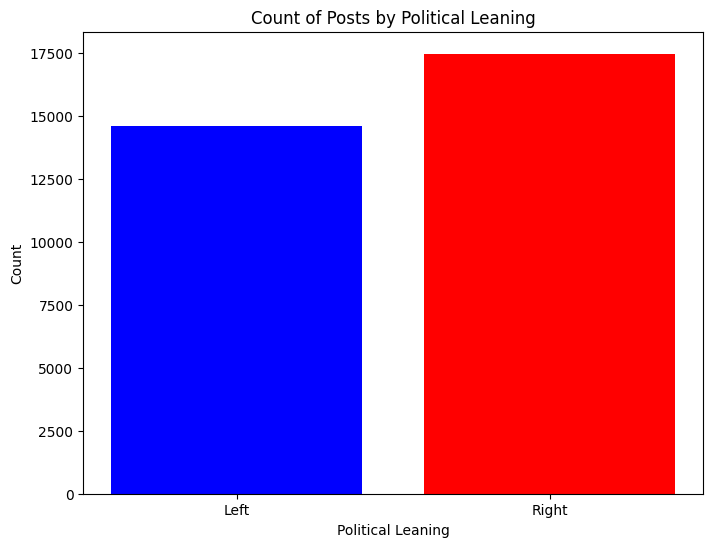

In [11]:
import matplotlib.pyplot as plt

# Group by 'political_leaning' and count the number of rows for each group
grouped_counts = df_not_english_only.groupby('political_leaning').agg(tokenized_post_count=('tokenized_post', 'count'))

# Reset the index to convert the result to a DataFrame
grouped_counts = grouped_counts.reset_index()

# Plotting
plt.figure(figsize=(8, 6))
plt.bar(grouped_counts['political_leaning'], grouped_counts['tokenized_post_count'], color=['blue', 'red'])
plt.xlabel('Political Leaning')
plt.ylabel('Count')
plt.xticks([0,1], ['Left', 'Right'])
plt.title('Count of Posts by Political Leaning')
plt.show()


### Count of most used words for each class

In [2]:
from collections import Counter

def parse_words_from_list(text):
    # Remove square brackets and single quotes
    text = text.strip("[]").replace("'", "")
    # Split the string by comma and strip whitespace
    words = [word.strip() for word in text.split(',')]
    return words

# Apply the function to parse words from the tokenized_post column
df_not_english_only['parsed_tokenized_post'] = df_not_english_only['tokenized_post'].apply(parse_words_from_list)

# Extract posts for left-leaning and right-leaning classes
left_posts = df_not_english_only[df_not_english_only['political_leaning'] == 'left']['parsed_tokenized_post']
right_posts = df_not_english_only[df_not_english_only['political_leaning'] == 'right']['parsed_tokenized_post']

# Flatten the list of tokenized posts for each class
left_words = [word for sublist in left_posts for word in sublist]
right_words = [word for sublist in right_posts for word in sublist]

# Count occurrences of each word for left-leaning and right-leaning posts
left_word_counts = Counter(left_words)
right_word_counts = Counter(right_words)

# Get the most common words for each class
most_common_left = left_word_counts.most_common()
most_common_right = right_word_counts.most_common()

print("Most common words for left-leaning class:", most_common_left)
print("Most common words for right-leaning class:", most_common_right)

Most common words for left-leaning class: [('like', 105296), ('people', 89956), ('one', 70908), ('would', 66232), ('get', 62448), ('gt', 53701), ('think', 53199), ('even', 46802), ('make', 46336), ('time', 45436), ('thing', 44070), ('also', 40915), ('know', 40774), ('good', 39043), ('really', 37920), ('right', 34696), ('way', 34689), ('want', 34676), ('still', 32629), ('mean', 32433), ('much', 31892), ('say', 30939), ('year', 30295), ('go', 29306), ('need', 28571), ('see', 28545), ('well', 27829), ('could', 27817), ('game', 26339), ('actually', 25240), ('something', 25145), ('work', 24770), ('going', 24567), ('point', 23785), ('got', 23288), ('u', 23141), ('take', 22767), ('yeah', 22296), ('someone', 22206), ('never', 22133), ('look', 22104), ('lot', 22103), ('better', 21328), ('first', 20577), ('use', 20119), ('sure', 19649), ('url', 19485), ('though', 19414), ('every', 19387), ('shit', 19075), ('back', 18815), ('bad', 18764), ('pretty', 18716), ('said', 18663), ('le', 18381), ('day',

C:\Users\benwi\AppData\Local\Temp\ipykernel_18216\765317730.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=left_counts, y=left_words, ax=axes[0], palette='bright')
C:\Users\benwi\AppData\Local\Temp\ipykernel_18216\765317730.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=right_counts, y=right_words, ax=axes[1], palette='pastel')


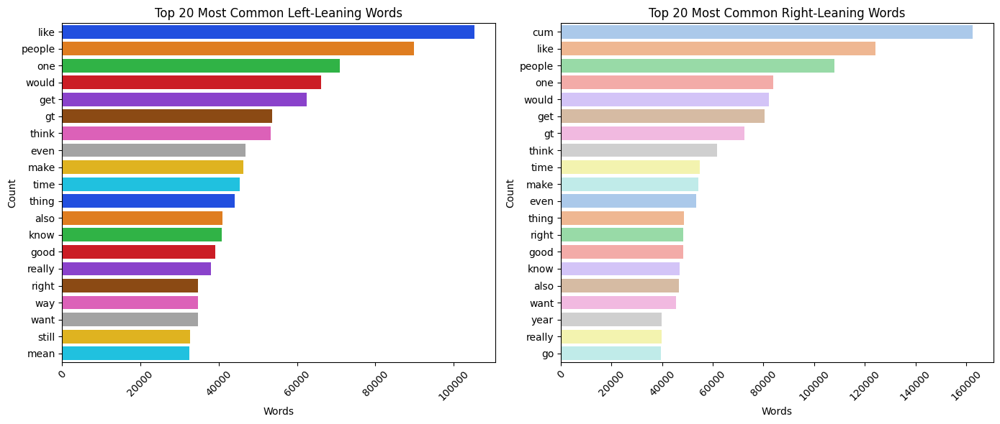

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 20 most common left-leaning words
top_20_left_words = most_common_left[:20]
left_words, left_counts = zip(*top_20_left_words)

# Get the top 20 most common right-leaning words
top_20_right_words = most_common_right[:20]
right_words, right_counts = zip(*top_20_right_words)

# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot the bar plot for left-leaning words
sns.barplot(x=left_counts, y=left_words, ax=axes[0], palette='bright')
axes[0].set_xlabel('Words')
axes[0].set_ylabel('Count')
axes[0].set_title('Top 20 Most Common Left-Leaning Words')
axes[0].tick_params(axis='x', rotation=45)

# Plot the bar plot for right-leaning words
sns.barplot(x=right_counts, y=right_words, ax=axes[1], palette='pastel')
axes[1].set_xlabel('Words')
axes[1].set_ylabel('Count')
axes[1].set_title('Top 20 Most Common Right-Leaning Words')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


### Most common left count words

In [38]:
most_common_left = left_word_counts.most_common()
print("Most common words for left-leaning class:", most_common_left)

Most common words for left-leaning class: [('like', 105296), ('people', 89956), ('one', 70908), ('would', 66232), ('get', 62448), ('gt', 53701), ('think', 53199), ('even', 46802), ('make', 46336), ('time', 45436), ('thing', 44070), ('also', 40915), ('know', 40774), ('good', 39043), ('really', 37920), ('right', 34696), ('way', 34689), ('want', 34676), ('still', 32629), ('mean', 32433), ('much', 31892), ('say', 30939), ('year', 30295), ('go', 29306), ('need', 28571), ('see', 28545), ('well', 27829), ('could', 27817), ('game', 26339), ('actually', 25240), ('something', 25145), ('work', 24770), ('going', 24567), ('point', 23785), ('got', 23288), ('u', 23141), ('take', 22767), ('yeah', 22296), ('someone', 22206), ('never', 22133), ('look', 22104), ('lot', 22103), ('better', 21328), ('first', 20577), ('use', 20119), ('sure', 19649), ('url', 19485), ('though', 19414), ('every', 19387), ('shit', 19075), ('back', 18815), ('bad', 18764), ('pretty', 18716), ('said', 18663), ('le', 18381), ('day',

### Most common right count words

In [43]:
most_common_right = right_word_counts.most_common()
print("Most common words for right-leaning class:", most_common_right[:5])

Most common words for right-leaning class: [('cum', 162676), ('like', 124344), ('people', 107873), ('one', 83743), ('would', 82231)]


In [37]:
print(most_common_left)

[('like', 105296), ('people', 89956), ('one', 70908), ('would', 66232), ('get', 62448), ('gt', 53701), ('think', 53199), ('even', 46802), ('make', 46336), ('time', 45436), ('thing', 44070), ('also', 40915), ('know', 40774), ('good', 39043), ('really', 37920), ('right', 34696), ('way', 34689), ('want', 34676), ('still', 32629), ('mean', 32433)]


In [3]:
# Initialize a dictionary to store word counts for each length
word_length_counts_left = {length: 0 for length in range(1, 2968)}

# Count occurrences of words for each length in most_common_left
for word, count in most_common_left:
    word_length = len(word)
    if 1 <= word_length <= 15:
        word_length_counts_left[word_length] += count

# Remove word lengths with count 0
word_length_counts = {length: count for length, count in word_length_counts_left.items() if count > 0}

# Print the counts for each word length
for length, count in word_length_counts.items():
    print(f"Words of length {length} count:", count)



Words of length 1 count: 33764
Words of length 2 count: 433122
Words of length 3 count: 1302812
Words of length 4 count: 2464665
Words of length 5 count: 1844352
Words of length 6 count: 1656000
Words of length 7 count: 1283498
Words of length 8 count: 877995
Words of length 9 count: 603947
Words of length 10 count: 413046
Words of length 11 count: 196582
Words of length 12 count: 100068
Words of length 13 count: 53467
Words of length 14 count: 24618
Words of length 15 count: 7728


In [30]:
# Initialize a dictionary to store word counts for each length
word_length_counts_right = {length: 0 for length in range(1, 2968)}

# Count occurrences of words for each length in most_common_right
for word, count in most_common_right:
    word_length = len(word)
    if 1 <= word_length <= 15:
        word_length_counts_right[word_length] += count

# Remove word lengths with count 0
word_length_counts = {length: count for length, count in word_length_counts_right.items() if count > 0}

# Print the counts for each word length
for length, count in word_length_counts.items():
    print(f"Words of length {length} count:", count)


Words of length 1 count: 44822
Words of length 2 count: 430682
Words of length 3 count: 1713215
Words of length 4 count: 2944107
Words of length 5 count: 2218309
Words of length 6 count: 1964565
Words of length 7 count: 1523164
Words of length 8 count: 1050696
Words of length 9 count: 697806
Words of length 10 count: 481434
Words of length 11 count: 225198
Words of length 12 count: 113056
Words of length 13 count: 56776
Words of length 14 count: 29281
Words of length 15 count: 7639
Words of length 16 count: 5443
Words of length 17 count: 2292
Words of length 18 count: 1559
Words of length 19 count: 750
Words of length 20 count: 581
Words of length 21 count: 542
Words of length 22 count: 173
Words of length 23 count: 150
Words of length 24 count: 89
Words of length 25 count: 79
Words of length 26 count: 38
Words of length 27 count: 39
Words of length 28 count: 27
Words of length 29 count: 29
Words of length 30 count: 21
Words of length 31 count: 17
Words of length 32 count: 22
Words of 

In [31]:
# Calculate the total length of all words and the total number of words
total_length = sum(len(word) * count for word, count in most_common_left)
total_words = sum(count for word, count in most_common_left)

# Calculate the average word length
average_word_length = total_length / total_words

print(f"Average word length of all left-leaning words: {average_word_length:.2f}")


Average word length of all left-leaning words: 5.67


In [34]:
# Calculate the total length of all words and the total number of words
total_length = sum(len(word) * count for word, count in most_common_right)
total_words = sum(count for word, count in most_common_right)

# Calculate the average word length
average_word_length = total_length / total_words

print(f"Average word length of all right-leaning words: {average_word_length:.2f}")

Average word length of all right-leaning words: 5.64


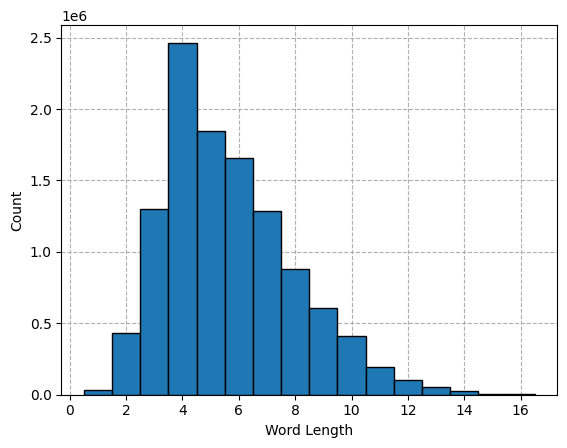

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Initialize a dictionary to store word counts for each length
word_length_counts = {length: 0 for length in range(1, 2968)}

# Count occurrences of words for each length in most_common_left
for word, count in most_common_left:
    word_length = len(word)
    if 1 <= word_length <= 2967:
        word_length_counts[word_length] += count

# Remove word lengths with count 0
word_length_counts = {length: count for length, count in word_length_counts.items() if count > 0}

# Filter word lengths between 1 and 16
filtered_word_length_counts = {length: count for length, count in word_length_counts.items() if 1 <= length <= 16}

# Extract data for plotting
lengths = list(filtered_word_length_counts.keys())
counts = list(filtered_word_length_counts.values())

# Calculate the bin edges
bins = np.arange(1, 18) - 0.5  # Bin edges will be at integers - 0.5 for separation lines

# Plot the histogram
plt.hist(lengths, weights=counts, bins=bins, align='mid', edgecolor='black')
plt.xlabel('Word Length')
plt.ylabel('Count')
# plt.title('Word Length Distribution')

# Set grid behind bars
plt.gca().set_axisbelow(True)
plt.grid(True, linestyle='--')

plt.show()



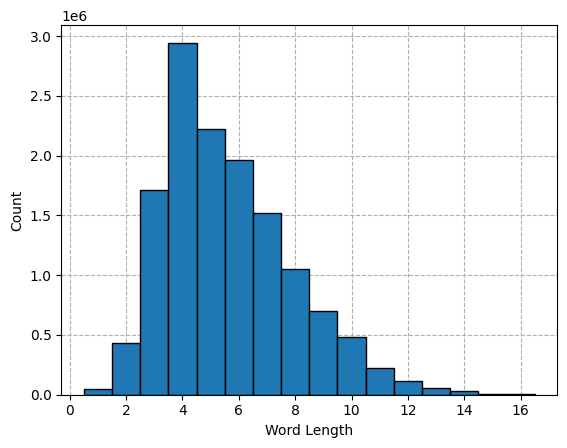

In [16]:

import numpy as np
import matplotlib.pyplot as plt

# Initialize a dictionary to store word counts for each length
word_length_counts = {length: 0 for length in range(1, 2968)}

# Count occurrences of words for each length in most_common_right
for word, count in most_common_right:
    word_length = len(word)
    if 1 <= word_length <= 2967:
        word_length_counts[word_length] += count

# Remove word lengths with count 0
word_length_counts = {length: count for length, count in word_length_counts.items() if count > 0}

# Filter word lengths between 1 and 16
filtered_word_length_counts = {length: count for length, count in word_length_counts.items() if 1 <= length <= 16}

# Extract data for plotting
lengths = list(filtered_word_length_counts.keys())
counts = list(filtered_word_length_counts.values())

# Calculate the bin edges
bins = np.arange(1, 18) - 0.5  # Bin edges will be at integers - 0.5 for separation lines

# Plot the histogram
plt.hist(lengths, weights=counts, bins=bins, align='mid', edgecolor='black')
plt.xlabel('Word Length')
plt.ylabel('Count')
# plt.title('Word Length Distribution')

# Set grid behind bars
plt.gca().set_axisbelow(True)
plt.grid(True, linestyle='--')

plt.show()

### Type Token Ratio

In [3]:
# Split the DataFrame based on the values in the "political_leaning" column
left_df = df_not_english_only[df_not_english_only['political_leaning'] == 'left']
right_df = df_not_english_only[df_not_english_only['political_leaning'] == 'right']

In [19]:
import ast

# Initialize variables to store the counts
total_words = 0
unique_words = set()

# Iterate over each row in the tokenized_post column
for post in right_df['tokenized_post']:
    # Safely evaluate the string representation of the list into an actual list
    word_list = ast.literal_eval(post)
    # Add the length of the list to the total count
    total_words += len(word_list)
    # Add all words from the list to the set
    unique_words.update(word_list)

# Calculate the type-token ratio (TTR)
ttr_right = len(unique_words) / total_words

# Print the type-token ratio (TTR)
print("Type-Token Ratio (TTR):", ttr_right)

Type-Token Ratio (TTR): 0.021097931959681907


In [20]:
import ast

# Initialize variables to store the counts
total_words = 0
unique_words = set()

# Iterate over each row in the tokenized_post column
for post in left_df['tokenized_post']:
    # Safely evaluate the string representation of the list into an actual list
    word_list = ast.literal_eval(post)
    # Add the length of the list to the total count
    total_words += len(word_list)
    # Add all words from the list to the set
    unique_words.update(word_list)

# Calculate the type-token ratio (TTR)
ttr_left = len(unique_words) / total_words

# Print the type-token ratio (TTR)
print("Type-Token Ratio (TTR):", ttr_left)

Type-Token Ratio (TTR): 0.024711338885057967


C:\Users\benwi\AppData\Local\Temp\ipykernel_18216\765317730.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=left_counts, y=left_words, ax=axes[0], palette='bright')
C:\Users\benwi\AppData\Local\Temp\ipykernel_18216\765317730.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=right_counts, y=right_words, ax=axes[1], palette='pastel')


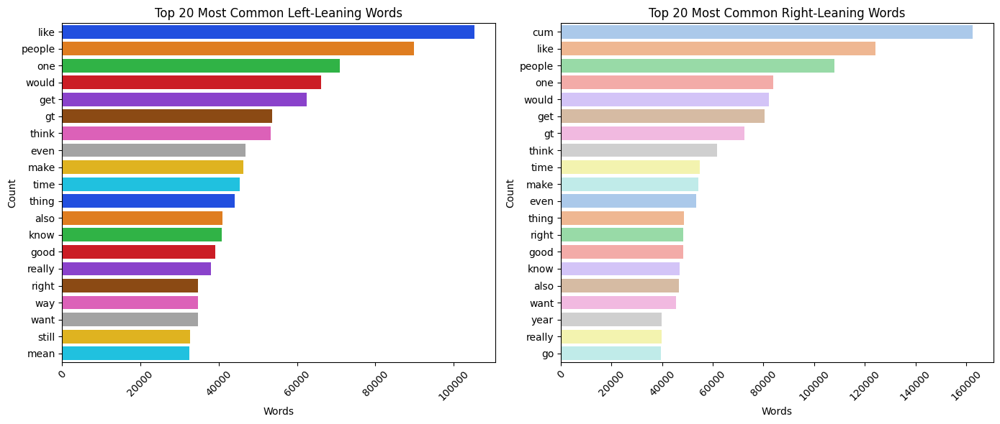

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 20 most common left-leaning words
top_20_left_words = most_common_left[:20]
left_words, left_counts = zip(*top_20_left_words)

# Get the top 20 most common right-leaning words
top_20_right_words = most_common_right[:20]
right_words, right_counts = zip(*top_20_right_words)

# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot the bar plot for left-leaning words
sns.barplot(x=left_counts, y=left_words, ax=axes[0], palette='bright')
axes[0].set_xlabel('Words')
axes[0].set_ylabel('Count')
axes[0].set_title('Top 20 Most Common Left-Leaning Words')
axes[0].tick_params(axis='x', rotation=45)

# Plot the bar plot for right-leaning words
sns.barplot(x=right_counts, y=right_words, ax=axes[1], palette='pastel')
axes[1].set_xlabel('Words')
axes[1].set_ylabel('Count')
axes[1].set_title('Top 20 Most Common Right-Leaning Words')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


In [25]:
pip install wordcloud

   ---------------------------------------- 0.0/300.2 kB ? eta -:--:--
   --- ----------------------------------- 30.7/300.2 kB 660.6 kB/s eta 0:00:01
   ---------- ---------------------------- 81.9/300.2 kB 919.0 kB/s eta 0:00:01
   ---------------------------------------  297.0/300.2 kB 2.3 MB/s eta 0:00:01
   ---------------------------------------- 300.2/300.2 kB 1.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


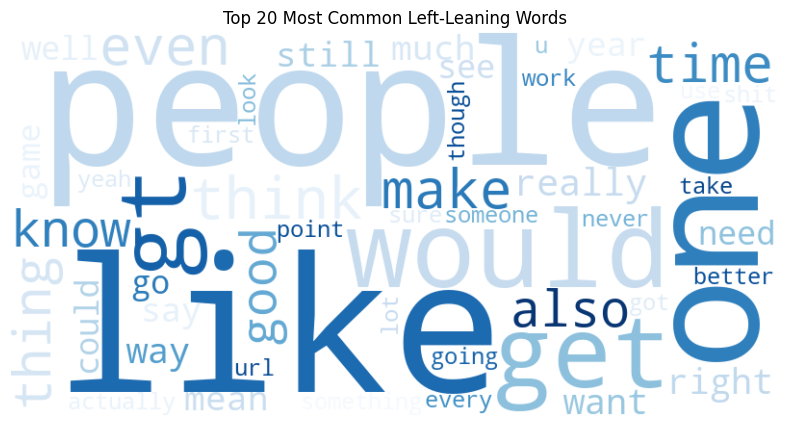

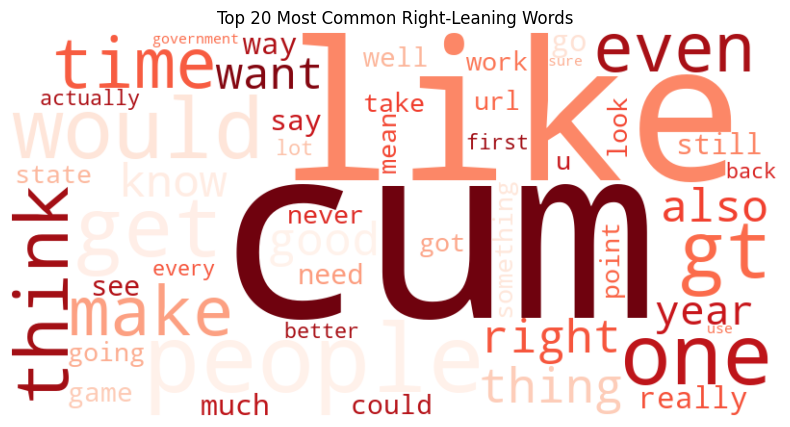

In [29]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

# Assuming most_common_left and most_common_right are already defined
# Extract the top 20 most common words for left and right leaning
top_50_left_words = most_common_left[:50]
top_50_right_words = most_common_right[:50]

# Convert the lists into dictionaries for word clouds
left_word_freq = dict(top_20_left_words)
right_word_freq = dict(top_20_right_words)

# Create word clouds
left_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate_from_frequencies(left_word_freq)
right_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate_from_frequencies(right_word_freq)

# Plot the left-leaning word cloud
plt.figure(figsize=(10, 5))
plt.imshow(left_wordcloud, interpolation='bilinear')
plt.title('Top 20 Most Common Left-Leaning Words')
plt.axis('off')
plt.show()

# Plot the right-leaning word cloud
plt.figure(figsize=(10, 5))
plt.imshow(right_wordcloud, interpolation='bilinear')
plt.title('Top 20 Most Common Right-Leaning Words')
plt.axis('off')
plt.show()

